# 📈 Project Summary: Modeling Forward Rates for Bond ETF Pricing

This Project aims to explore and model forward rates from the US Treasury curve using a classic stochastic model, to ultimately price an investment-grade bond ETF (LQD).

## ⚙️ Assumptions

- **Forward rates are perfect predictors** of future spot rates. While they are often interpreted as market expectations, empirical evidence and deviations from the **Expectations Hypothesis** suggest they do not hold as reliable forecasts.
- For modeling purposes, we treat forward rates as **observed variables** to be predicted, aware of their limitations.
- Some forward rates are derived from **interpolated spot rates**, which limits precision, but are assumed accurate enough for this educational and methodological project.

## 🏗️ Term Structure Modeling Approach

We use **short-rate term structure models**, particularly the **Cox-Ingersoll-Ross (CIR)** model, to simulate the behavior of individual forward rates (e.g. f(1,2), f(2,3), ..., f(12,13)).

### ➕ Why CIR?

| Feature                     | CIR / Classic Short Rate Model               | HJM (Heath-Jarrow-Morton)                        |
|----------------------------|-----------------------------------------------|--------------------------------------------------|
| **Model Target**           | One short-term interest rate (e.g. f(t,t+1)) | The entire forward curve                        |
| **Perspective**            | Endogenous (models rate as SDE)              | Exogenous (models forward curve dynamics)       |
| **Pros**                   | Intuitive, tractable, computationally light  | Richer, captures curve dynamics                 |
| **Cons**                   | Requires separate models for each segment    | Computationally heavy, complex calibration      |
| **Use Case Fit**           | Suitable for bond and ETF pricing            | Better for swaptions, complex derivatives       |

## 🧮 Methodology Summary

- **13 CIR models** will be calibrated, one per annual forward rate f(t,t+1), up to year 13.
- Some forward rates are **interpolated** due to missing market data — these are approximations.
- **Numerical optimization** is used to calibrate CIR parameters, minimizing the difference between model and observed forward rates.
- We compare:
  - **Forward rates derived from spot curves**
  - **Forward rates directly implied by swap rates**

## 💸 ETF Pricing Use Case

We apply predicted forward rates to **price the LQD ETF** as if it were a single bond:

- Assumes constant average **effective maturity (~12.91 years)**.
- Uses average **coupon rate of 4.35%**.
- Ignores reinvestment and bond turnover for simplicity.
- Treats ETF as a fixed instrument for valuation purposes.
- Based on data from **BlackRock's website (as of 2025)**.

## Import libraries

In [1]:
import pandas_datareader.data as web
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import datetime as dt
import QuantLib as ql
import yfinance as yf

from scipy.optimize import newton, minimize
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go
import plotly.express as px

%matplotlib inline

## Download data

### US Treasury Yields

A **Treasury yield** is the return on investment, expressed as a percentage, earned by holding a U.S. government bond until maturity.

In [2]:
# Define the start and end date for the data
start_date = dt.datetime(2001, 1, 1)
end_date = dt.datetime.today()

# Define FRED tickers for Treasury rates by maturity
# These are annualized interest rates for US government bonds
tickers = {
    'GS1': '1Y',
    'GS2': '2Y',
    'GS3': '3Y',
    'GS5': '5Y',
    'GS7': '7Y',
    'GS10': '10Y',
    'GS20': '20Y',
    'GS30': '30Y'
}

# Download the data from FRED
rates_df = pd.DataFrame()
for ticker, label in tickers.items():
    data = web.DataReader(ticker, 'fred', start_date, end_date)
    data.columns = [label]
    rates_df = pd.concat([rates_df, data], axis=1)

# Show a preview and missing values
print("Missing values per maturity:")
print(rates_df.isna().sum())
print('--------------------')
rates_df.head()


Missing values per maturity:
1Y     0
2Y     0
3Y     0
5Y     0
7Y     0
10Y    0
20Y    0
30Y    0
dtype: int64
--------------------


,1Y,2Y,3Y,5Y,7Y,10Y,20Y,30Y
DATE,,,,,,,,
2001-01-01,4.81,4.76,4.77,4.86,5.13,5.16,5.65,5.54
2001-02-01,4.68,4.66,4.71,4.89,5.10,5.10,5.62,5.45
2001-03-01,4.30,4.34,4.43,4.64,4.88,4.89,5.49,5.34
2001-04-01,3.98,4.23,4.42,4.76,5.03,5.14,5.78,5.65
2001-05-01,3.78,4.26,4.51,4.93,5.24,5.39,5.92,5.78


### Swap Rates

#### What is a Swap Rate?

A $\textbf{swap rate}$ is the fixed interest rate that one party agrees to pay in exchange for receiving a floating rate in a financial contract known as an $\textit{interest rate swap}$. Typically, the floating rate is tied to an underlying benchmark such as LIBOR or SOFR.

The swap rate reflects the price at which two parties agree to exchange the fixed and floating cash flows over a certain maturity. In the context of calibrating forward rates, we can use observed swap rates for various maturities to infer the expectations of future interest rates in the market.

$
\text{Fixed Rate} = \text{Swap Rate}
$

In [3]:
swap_tickers = {
    'DSWP1': '1Y',
    'DSWP2': '2Y',
    'DSWP3': '3Y',
    'DSWP5': '5Y',
    'DSWP7': '7Y',
    'DSWP10': '10Y',
    'DSWP30': '30Y'
}

# Download swap rates
swap_df = pd.DataFrame()
for ticker, label in swap_tickers.items():
    data = web.DataReader(ticker, 'fred', start_date, end_date)
    data.columns = [label]
    swap_df = pd.concat([swap_df, data], axis=1)
    
# Show preview
print("Missing values per maturity:")
print(swap_df.isna().sum())
print('--------------------')
swap_df.head()


Missing values per maturity:
1Y     174
2Y     174
3Y     174
5Y     174
7Y     174
10Y    174
30Y    174
dtype: int64
--------------------


,1Y,2Y,3Y,5Y,7Y,10Y,30Y
DATE,,,,,,,
2001-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-01-02,5.81,5.68,5.71,5.79,5.85,5.95,6.18
2001-01-03,5.77,5.66,5.69,5.78,5.84,5.92,6.13
2001-01-04,5.48,5.51,5.61,5.78,5.88,6.00,6.21
2001-01-05,5.35,5.38,5.48,5.64,5.76,5.90,6.15


### iShares iBoxx $ Investment Grade Corporate Bond ETF (LQD)

#### What is LQD?

**LQD** refers to the *iShares iBoxx $ Investment Grade Corporate Bond ETF*. It tracks the performance of a broad range of U.S. dollar-denominated investment-grade corporate bonds.

We collect historical data from LQD as a **proxy for corporate bond prices**. Unlike Treasury securities, corporate bonds include **credit risk and liquidity premiums**, making LQD a useful benchmark for evaluating how well our **forward rate models** (e.g., CIR) can predict prices that incorporate real-world market spreads.

By comparing our model-generated forward curves (derived from Treasury-based spot rates or swap rates) against actual market-traded bond instruments like LQD, we can assess model accuracy and explore its potential real-world applicability.

In [4]:
# Define the ticker symbol for iShares iBoxx $ Investment Grade Corporate Bond ETF
ticker = 'LQD'

# Download historical daily data from Yahoo Finance
lqd_df = yf.download(ticker, start='2015-01-01', end='2023-12-31',group_by='column', auto_adjust=False)
lqd_df.columns = ['_'.join(col).strip() for col in lqd_df.columns.values]

# Display the first few rows of the data
lqd_df.head()

[*********************100%***********************]  1 of 1 completed


,Adj Close_LQD,Close_LQD,High_LQD,Low_LQD,Open_LQD,Volume_LQD
Date,,,,,,
2015-01-02,84.763893,119.830002,120.239998,119.550003,119.599998,2523600
2015-01-05,85.110558,120.320000,120.680000,120.089996,120.190002,3218800
2015-01-06,85.457161,120.809998,121.169998,120.470001,120.650002,5313400
2015-01-07,85.570374,120.970001,121.050003,120.510002,120.639999,1636600
2015-01-08,85.294479,120.580002,120.669998,120.370003,120.650002,2156900


## Clean Datasets

### Matching Treasury and Swap Dates

Treasury yields are recorded on the **first calendar day** of each month, which may fall on weekends or holidays. In contrast, swap rates are available on **business days**. Instead of intersecting indices (which could remove valuable data), we align the swap data by selecting the **first available swap rate on or after each Treasury date**.

This approach ensures consistency in our time series and avoids losing data due to mismatched timestamps.

In [5]:
# Resample swap data to monthly using the first business day

swap_df_monthly = swap_df.dropna().resample('MS').first()

In [6]:
# Normalize to remove time component if present
rates_df.index = pd.to_datetime(rates_df.index).normalize()
swap_df_monthly.index = pd.to_datetime(swap_df_monthly.index).normalize()

# Intersect indices to keep only common dates in both dataframes
common_dates = rates_df.index.intersection(swap_df_monthly.index)

# Filter the Treasury yields DataFrame and Swap rates DataFrame to keep only dates with valid swap data
rates_df = rates_df.loc[common_dates]
swap_df_monthly = swap_df_monthly.loc[common_dates]

# Check that both DataFrames now share the same date index
print("Swap data shape:", swap_df_monthly.shape)
print("Filtered Treasury data shape:", rates_df.shape)

Swap data shape: (190, 7)
Filtered Treasury data shape: (190, 8)


In [7]:
#Check if any months are missing
# Generate complete monthly date range between first and last date
full_months = pd.date_range(start=swap_df_monthly.index.min(), 
                            end=swap_df_monthly.index.max(), 
                            freq='MS')

# Find which months are missing
missing_months = full_months.difference(swap_df_monthly.index)

print(f"Missing months: {missing_months}")
print(f"Total missing: {len(missing_months)}")

print(f"First month: {swap_df_monthly.index.min()}")
print(f"Last month: {swap_df_monthly.index.max()}")

Missing months: DatetimeIndex([], dtype='datetime64[ns]', freq='MS')
Total missing: 0
First month: 2001-01-01 00:00:00
Last month: 2016-10-01 00:00:00


In [8]:
swap_df_monthly.isna().sum()

1Y     0
2Y     0
3Y     0
5Y     0
7Y     0
10Y    0
30Y    0
dtype: int64

## Estimate not available maturities

Since we do not have all maturities available, we linearly interpolate the missing ones to complete the yield curve.

In [9]:
def interpolate_rates(spot_df, max_maturity=13):
    """
    Interpolates spot rates for integer maturities up to a target year.

    Args:
        spot_df (pd.DataFrame): DataFrame with spot rates, maturities as columns (e.g. '1Y', '2Y', ..., '30Y').
        max_maturity (int): The maximum maturity (in years) to interpolate up to.

    Returns:
        pd.DataFrame: A new DataFrame with interpolated spot rates for all integer maturities up to max_maturity.
    """
    import numpy as np

    # Convert column names to numeric maturities (e.g. '1Y' → 1.0)
    numeric_cols = [int(col.replace('Y', '')) for col in spot_df.columns]
    spot_df.columns = numeric_cols

    # Create target maturities (1 to max_maturity)
    target_maturities = list(range(1, max_maturity + 1))

    # Interpolate for each row in the DataFrame
    interpolated_df = spot_df.apply(
        lambda row: np.interp(target_maturities, numeric_cols, row), axis=1
    )

    # Convert result back to DataFrame with appropriate column names
    interpolated_df = pd.DataFrame(interpolated_df.tolist(), 
                                   index=spot_df.index,
                                   columns=[f"{maturity}Y" for maturity in target_maturities])
    
    # Round to 2 decimal places
    interpolated_df = interpolated_df.round(2)

    return interpolated_df

In [10]:
rates_df = interpolate_rates(rates_df, max_maturity=13)
rates_df.head()

,1Y,2Y,3Y,4Y,5Y,6Y,7Y,8Y,9Y,10Y,11Y,12Y,13Y
DATE,,,,,,,,,,,,,
2001-01-01,4.81,4.76,4.77,4.81,4.86,5.00,5.13,5.14,5.15,5.16,5.21,5.26,5.31
2001-02-01,4.68,4.66,4.71,4.80,4.89,4.99,5.10,5.10,5.10,5.10,5.15,5.20,5.26
2001-03-01,4.30,4.34,4.43,4.54,4.64,4.76,4.88,4.88,4.89,4.89,4.95,5.01,5.07
2001-04-01,3.98,4.23,4.42,4.59,4.76,4.89,5.03,5.07,5.10,5.14,5.20,5.27,5.33
2001-05-01,3.78,4.26,4.51,4.72,4.93,5.08,5.24,5.29,5.34,5.39,5.44,5.50,5.55


In [11]:
swap_df_monthly = interpolate_rates(swap_df_monthly, max_maturity=13)
swap_df_monthly.head()

,1Y,2Y,3Y,4Y,5Y,6Y,7Y,8Y,9Y,10Y,11Y,12Y,13Y
DATE,,,,,,,,,,,,,
2001-01-01,5.81,5.68,5.71,5.75,5.79,5.82,5.85,5.88,5.92,5.95,5.96,5.97,5.98
2001-02-01,5.10,5.16,5.31,5.41,5.52,5.60,5.69,5.75,5.80,5.86,5.87,5.89,5.90
2001-03-01,4.91,5.05,5.22,5.34,5.46,5.54,5.62,5.67,5.71,5.76,5.78,5.79,5.81
2001-04-01,4.64,4.86,5.13,5.30,5.47,5.58,5.70,5.77,5.84,5.91,5.93,5.95,5.97
2001-05-01,4.41,4.83,5.18,5.39,5.60,5.73,5.86,5.95,6.03,6.12,6.14,6.16,6.17


## Visualize Fed Funds Rate

### Spot Rate Time Series

This chart displays the evolution over time US Treasury spot rates.

Tracking their behavior helps understand how short-, medium-, and long-term interest rates have moved historically, and gives insights into market expectations, monetary policy changes, and macroeconomic sentiment.

In [12]:
# def plot_selected_spot_curves(spot_rate_data, maturities):
#     """
#     Plot selected spot rate curves over time using Plotly.

#     Args:
#         spot_rate_data (pandas.DataFrame): DataFrame with multiple Treasury yields by maturity.
#         maturities (list): List of column names (maturities) to include in the plot.
#     """
#     traces = []

#     for maturity in maturities:
#         trace = go.Scatter(
#             x=spot_rate_data.index.tolist(),
#             y=spot_rate_data[maturity].values.tolist(),
#             mode='lines',
#             name=f'{maturity} Treasury Yield',
#         )
#         traces.append(trace)

#     layout = go.Layout(
#         title='Selected US Treasury Spot Rates Over Time',
#         xaxis=dict(title='Date'),
#         yaxis=dict(title='Yield (%)'),
#         template='plotly_dark',
#         height=600,
#         width=1000
#     )

#     fig = go.Figure(data=traces, layout=layout)
#     fig.show()

# # Define the maturities to plot
# selected_maturities = rates_df.columns

# # Plot the spot rate curves
# plot_selected_spot_curves(rates_df, selected_maturities)

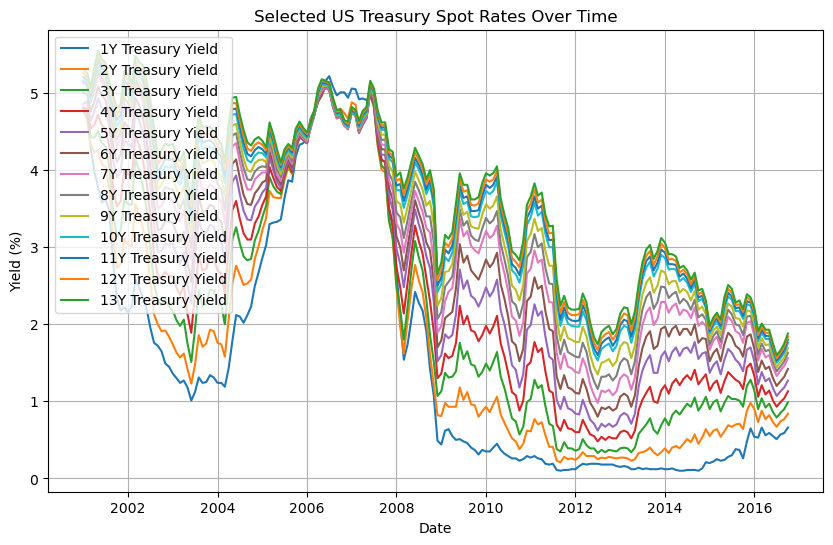

In [13]:
def plot_selected_spot_curves_matplotlib(spot_rate_data, maturities):
    """
    Plot selected spot rate curves over time using Matplotlib.

    Args:
        spot_rate_data (pandas.DataFrame): DataFrame with multiple Treasury yields by maturity.
        maturities (list): List of column names (maturities) to include in the plot.
    """
    plt.figure(figsize=(10, 6))

    for maturity in maturities:
        plt.plot(spot_rate_data.index, spot_rate_data[maturity], label=f'{maturity} Treasury Yield')

    plt.title('Selected US Treasury Spot Rates Over Time')
    plt.xlabel('Date')
    plt.ylabel('Yield (%)')
    plt.legend(loc='upper left')
    plt.grid(True)

    # Show the plot
    plt.show()

# Define the maturities to plot
selected_maturities = rates_df.columns

# Plot the spot rate curves
plot_selected_spot_curves_matplotlib(rates_df, selected_maturities)

### Latest Spot Curve

In [14]:
# def plot_latest_spot_curve(spot_rate_data):
#     """
#     Plot the most recent spot curve (yield vs maturity) using Plotly.

#     Args:
#         spot_rate_data (pandas.DataFrame): DataFrame with Treasury yields by maturity.
#     """
#     # Get the last available row (most recent date)
#     latest_data = spot_rate_data.dropna().iloc[-1]

#     # Extract maturities and corresponding yields
#     maturities = [int(m.strip('Y')) for m in latest_data.index]  # Convert '1Y' -> 1
#     yields = latest_data.values

#     # Sort maturities and yields by maturity
#     sorted_pairs = sorted(zip(maturities, yields))
#     sorted_maturities, sorted_yields = zip(*sorted_pairs)

#     trace = go.Scatter(
#         x=sorted_maturities,
#         y=sorted_yields,
#         mode='lines+markers',
#         name='Latest Spot Curve',
#         line=dict(color='cyan', width=3)
#     )

#     layout = go.Layout(
#         title=f"Spot Curve as of {latest_data.name.strftime('%Y-%m-%d')}",
#         xaxis=dict(title='Maturity (Years)', tickmode='linear'),
#         yaxis=dict(title='Yield (%)'),
#         template='plotly_dark',
#         height=500,
#         width=900
#     )

#     fig = go.Figure(data=[trace], layout=layout)
#     fig.show()

# # Plot the latest spot curve
# plot_latest_spot_curve(rates_df)

## Forward Rate Formula

The **forward rate** is the interest rate implied by current interest rates for borrowing/lending over a specific future period. It can be calculated using the following formula:

$$
f(t, T) = \frac{(1 + r(T))^T}{(1 + r(t))^t} - 1
$$

Where:

- \( r(t) \) is the spot interest rate at time \( t \).
- \( r(T) \) is the spot interest rate at time \( T \).
- \( f(t, T) \) is the forward rate between time \( t \) and \( T \).

#### Explanation:

- The formula calculates the **forward rate** between two points in time, \( t \) and \( T \), based on the current spot rates \( r(t) \) and \( r(T) \). 
- **Spot rate** is the current interest rate for a given maturity.
- The forward rate is a way to compute the implied interest rate for borrowing or lending money for a future period, based on today's rates.

The formula essentially compares the return of investing from time \( t \) to time \( T \), assuming reinvestment of the spot rate \( r(t) \) and \( r(T) \), and extracts the rate that equates those two returns.


In [15]:
def calculate_forward_rate(r_t, r_T, t, T):
    """
    Calculate the forward rate between two maturities t and T.

    Parameters:
        r_t (Series): Spot rate at time t
        r_T (Series): Spot rate at time T
        t (float): Time period for rate r_t
        T (float): Time period for rate r_T
    
    Returns:
        Series: The forward rate between time t and T
    """
    return ((1 + r_T / 100) ** T / (1 + r_t / 100) ** t) ** (1 / (T - t)) - 1

In [16]:
# List of available maturities (in years)
maturities = [int(col.strip('Y')) for col in rates_df.columns]

# Empty DataFrame to store forward rates
forward_spot_df = pd.DataFrame(index=rates_df.index)

# Loop through pairs (t, T) to calculate f(t, T)
for i in range(len(maturities) - 1):
    t = maturities[i]
    T = maturities[i+1]

    z_t = rates_df[f"{t}Y"]
    z_T = rates_df[f"{T}Y"]

    fwd_rate = calculate_forward_rate(z_t, z_T, t, T)
    forward_spot_df[f"{t}Y-{T}Y"] = fwd_rate

forward_spot_df = forward_spot_df.dropna()

In [17]:
forward_spot_df.head()

,1Y-2Y,2Y-3Y,3Y-4Y,4Y-5Y,5Y-6Y,6Y-7Y,7Y-8Y,8Y-9Y,9Y-10Y,10Y-11Y,11Y-12Y,12Y-13Y
DATE,,,,,,,,,,,,
2001-01-01,0.047100,0.047900,0.049301,0.050602,0.057028,0.059134,0.052100,0.052300,0.052500,0.057113,0.058116,0.059119
2001-02-01,0.046400,0.048101,0.050705,0.052508,0.054914,0.057624,0.051000,0.051000,0.051000,0.056513,0.057516,0.059827
2001-03-01,0.043800,0.046102,0.048707,0.050410,0.053621,0.056029,0.048800,0.049700,0.048900,0.055519,0.056723,0.057927
2001-04-01,0.044806,0.048010,0.051017,0.054428,0.055424,0.058739,0.053504,0.053403,0.055007,0.058019,0.060431,0.060527
2001-05-01,0.047422,0.050118,0.053525,0.057742,0.058332,0.062051,0.056407,0.057409,0.058411,0.059413,0.061623,0.061519


## Visualize Forward rates

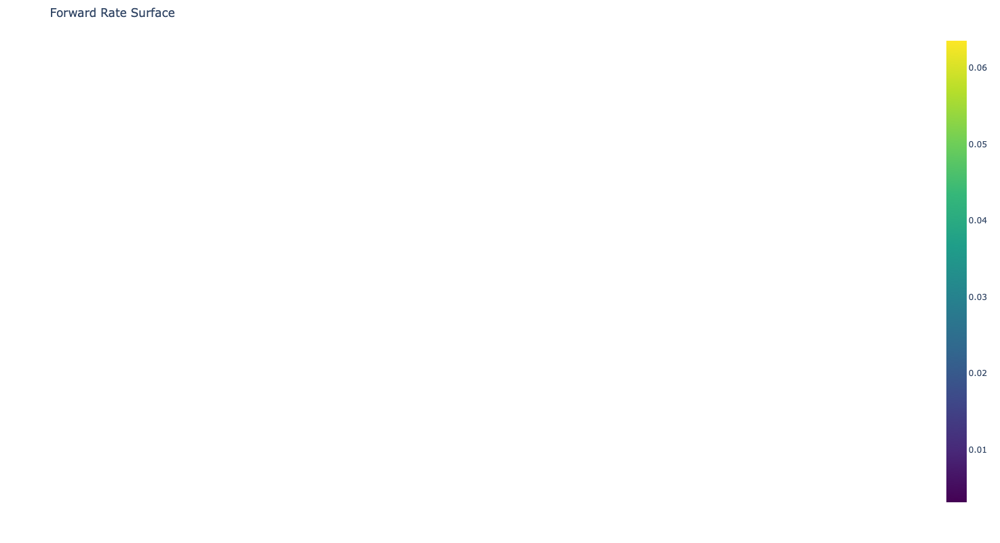

In [18]:
def plot_forward_rate_surface(forward_rate_surface):
    """
    Plot the surface of forward rates using Plotly with improved layout for better visualization.
    
    Args:
        forward_rate_surface (pandas.DataFrame): DataFrame containing the forward rate matrix.
    """
    # Extract the data for the plot
    x = forward_rate_surface.columns.tolist()
    y = forward_rate_surface.index.tolist()
    z = forward_rate_surface.values.tolist()

    # Create the surface plot using plotly.graph_objects
    fig = go.Figure(data=[go.Surface(z=z, x=x, y=y, colorscale='Viridis')])

    # Update the layout for better visualization
    fig.update_layout(
        title='Forward Rate Surface',
        scene=dict(
            xaxis_title='Start Maturity (Years)',
            yaxis_title='Calendar Date',
            zaxis_title='Forward Rate (%)',
            xaxis=dict(showgrid=True, gridwidth=2, ticklen=5, tickfont=dict(size=16)),
            yaxis=dict(showgrid=True, gridwidth=2, ticklen=5, tickfont=dict(size=16)),
            zaxis=dict(showgrid=True, gridwidth=2, ticklen=5, tickfont=dict(size=16)),
        ),
        coloraxis_colorbar=dict(title='Forward Rate (%)'),
        width=1000,  # Increase width of the figure
        height=800,  # Increase height of the figure
        margin=dict(l=50, r=50, b=50, t=50)  # Set margins to avoid clipping
    )

    # Show the plot
    fig.show()

# Plot the forward rate surface
plot_forward_rate_surface(forward_spot_df)

### Analysis of Forward Rates and Economic Events (2007-2015)

In this section, we analyze the historical behavior of forward rates from 2007 to 2015, focusing on their interaction with key economic events, monetary policies, and regulatory changes. We aim to highlight two important insights:

1. **Forward Rates Should Not Be Interpreted as Reliable Leading Indicators:**
   - While forward rates often reflect market expectations, they should not be viewed as infallible leading indicators of future economic conditions. Although they can sometimes anticipate liquidity problems or market stress (e.g., spikes in 2007-2008), they do not consistently predict broader economic downturns or recessions. 
   - This was evident during the 2007-2008 financial crisis, where **forward rate movements** did offer some signals, but they were not consistently accurate in predicting the timing or severity of the crisis.

2. **Short-Term Rates Are More Affected During Liquidity Crises Than Long-Term Rates:**
   - During financial crises or periods of liquidity stress, **short-term rates** (such as overnight and 1-year forward rates) tend to be more volatile and sensitive to central bank interventions (e.g., interest rate cuts, QE) than **long-term rates**. This results in significant movements in the short end of the yield curve, often causing **yield curve flattening** or **inversion**.
   - For instance, in 2007-2008, the **Fed's aggressive rate cuts** led to dramatic drops in short-term rates, which was part of the reason why the yield curve flattened. The long-term rates, however, remained more stable due to continued demand for safe-haven assets, such as U.S. Treasuries.
   - The curve inversion observed at times during the crisis can be explained by the greater uncertainty surrounding short-term liquidity compared to the more predictable long-term economic outlook.

#### Key Events and Their Impact on Forward Rates:

1. **2007 Financial Crisis:**
    - The spike in **forward rates** in mid-2007 (especially in `f(1,1)`) indicated liquidity tightening in the market, which was a precursor to the 2008 financial crisis. However, this was not a clear signal of the broader financial collapse, reinforcing the point that forward rates are not always reliable leading indicators.

2. **2008-2009:**
    - As the **Fed aggressively cut interest rates** to counter the crisis, short-term forward rates fell sharply. The **quantitative easing (QE)** measures and **TARP** program further impacted short-term rates, resulting in significant curve flattening. Long-term rates remained relatively stable due to the flight to safety, as Treasuries were seen as a secure investment.
    - The **collapse of Fannie Mae and Freddie Mac** further stressed liquidity, but the reaction in long-term forward rates was more muted compared to the drastic changes at the short end.

3. **Post-Crisis Period (2011-2015):**
    - From 2011 onwards, forward rates remained very low, especially the short-term rates (`f(1,2)`), reflecting continued **low demand for credit** and **market uncertainty** in the aftermath of the financial crisis.
    - The **Eurozone crisis** also contributed to the demand for **U.S. Treasuries** as safe-haven assets, keeping long-term rates relatively stable, while short-term rates were driven further down by continued Fed intervention.

4. **Basilea III Regulations:**
    - Post-crisis **Basilea III** regulations imposed **higher capital and liquidity requirements** on financial institutions, which resulted in increased demand for high-quality collateral such as U.S. Treasuries.
    - These regulations and the low-interest-rate environment created a situation where forward rates remained persistently low, particularly at the short end of the curve.

#### Key Takeaways:

- **Forward rates** are useful for understanding market expectations, but they should not be relied upon as definitive leading indicators. Their movements, while reflecting investor sentiment, are often influenced by short-term liquidity concerns and central bank policies, making them imperfect predictors of future economic conditions.
- **Short-term rates** are more sensitive to liquidity crises and central bank interventions than long-term rates. This can cause significant flattening or inversion of the yield curve during times of crisis, as seen during the 2007-2008 period.
- The **Fed’s monetary policies** and **quantitative easing** played a critical role in driving short-term rates down, while long-term rates remained more stable due to sustained demand for **safe assets** like U.S. Treasuries.
- The **Basilea III regulations** and continued demand for high-quality collateral further contributed to the low levels of forward rates seen post-crisis.

This historical context enhances our understanding of forward rates and helps inform the calibration of financial models such as the **Cox-Ingersoll-Ross (CIR) model**, which we are using to predict future interest rates and price bonds.

## Bootstrapping Discount Factors and Computing Forward Rates

In this section we show how to derive the zero‑coupon discount factors from market swap rates and then extract the implied one‑period forward rates.

### From Swap Rates to Discount Factors

A par swap rate $S_N$ for maturity $N$ (annual pay) satisfies:

$$
S_N \;=\; \frac{1 - D(N)}{\sum_{i=1}^{N} D(i)}
$$

where:
- $D(i)$ is the discount factor at time $i$, i.e. the present value of \\$1 paid at time $i$.
- $S_N$ is the fixed swap rate observed in the market for an $N$ ‑ year swap.

We solve this **recursively**:

1. **For $N=1$:**
   $$
   S_1 = \frac{1 - D(1)}{D(1)}
   \quad\Longrightarrow\quad
   D(1) = \frac{1}{1 + S_1}
   $$
2. **For general $N>1$:**
   $$
   S_N = \frac{1 - D(N)}{\sum_{i=1}^{N} D(i)}
   \quad\Longrightarrow\quad
   D(N)\,(1 + S_N) = 1 - S_N \sum_{i=1}^{N-1} D(i)
   \quad\Longrightarrow\quad
   D(N) = \frac{1 - S_N \sum_{i=1}^{N-1}D(i)}{1 + S_N}
   $$

This bootstraps a full set of discount factors $\{D(1), D(2), \dots, D(N)\}$.

### From Discount Factors to Forward Rates

Once we have $D(i)$ for $i=1,\dots,N$, the **one‑period forward rate** for the interval $[i,\,i+1]$ is

$$
f(i,\,i+1)
\;=\;
\frac{D(i)}{D(i+1)} \;-\; 1
$$

Equivalently, for any $t < T$ (with annual compounding),

$$
f(t,\,T)
\;=\;
\Bigl(\tfrac{D(t)}{D(T)}\Bigr)^{\!\frac{1}{T - t}}
\;-\;1.
$$

These forward rates represent the market’s implied yield for a loan starting at time $t$ and maturing at time $T$.

---

By following these two steps—bootstrapping discount factors from observable swap rates, and then converting discount factors into forward rates—we obtain a fully arbitrage‑free forward curve that is consistent with market swap quotes.

In [19]:
def discount_factor(rate, years):
    """
    Calculate the discount factor for a given rate and period.
    
    Args:
        rate (float): The rate used to discount.
        years (int): The number of years for the maturity.
        
    Returns:
        float: The discount factor for the given rate and maturity.
    """
    return 1 / (1 + rate)**years

def bootstrap_swap_rates(swap_df):
    """
    Perform bootstrapping on swap rates for all dates to calculate implied forward rates.

    Args:
        swap_df (pandas.DataFrame): DataFrame where rows are dates and columns are swap maturities (e.g., '1Y', '2Y').

    Returns:
        pandas.DataFrame: DataFrame of forward rates indexed by date and labeled by forward period (e.g., '1Y-2Y'),
                          with values in decimal format (e.g., 0.042 for 4.2%).
    """
    # Prepare output DataFrame
    forward_rates_all = pd.DataFrame(index=swap_df.index)

    # Convert maturities to sorted integers (e.g., '1Y' -> 1)
    maturities = sorted([int(col.strip('Y')) for col in swap_df.columns])
    maturity_labels = {int(col.strip('Y')): col for col in swap_df.columns}

    for i in range(len(maturities) - 1):
        t1 = maturities[i]
        t2 = maturities[i + 1]

        # Swap rate columns for the two maturities
        r1_col = maturity_labels[t1]
        r2_col = maturity_labels[t2]

        # Calculate discount factors using the custom function
        df1 = swap_df[r1_col].apply(lambda r: discount_factor(r / 100, t1))
        df2 = swap_df[r2_col].apply(lambda r: discount_factor(r / 100, t2))

        # Compute implied forward rates (as decimals)
        forward_rate = ((df1 / df2) ** (1 / (t2 - t1))) - 1

        # Save forward rates (already in decimal format)
        label = f"{t1}Y-{t2}Y"
        forward_rates_all[label] = forward_rate.round(4)

    return forward_rates_all

# Bootstrapping the swap rates to calculate forward rates
forward_swaps_df = bootstrap_swap_rates(swap_df_monthly)

# Display the calculated forward rates
forward_swaps_df.head()

,1Y-2Y,2Y-3Y,3Y-4Y,4Y-5Y,5Y-6Y,6Y-7Y,7Y-8Y,8Y-9Y,9Y-10Y,10Y-11Y,11Y-12Y,12Y-13Y
DATE,,,,,,,,,,,,
2001-01-01,0.0555,0.0577,0.0587,0.0595,0.0597,0.0603,0.0609,0.0624,0.0622,0.0606,0.0608,0.0610
2001-02-01,0.0522,0.0561,0.0571,0.0596,0.0600,0.0623,0.0617,0.0620,0.0640,0.0597,0.0611,0.0602
2001-03-01,0.0519,0.0556,0.0570,0.0594,0.0594,0.0610,0.0602,0.0603,0.0621,0.0598,0.0590,0.0605
2001-04-01,0.0508,0.0567,0.0581,0.0615,0.0613,0.0642,0.0626,0.0640,0.0654,0.0613,0.0617,0.0621
2001-05-01,0.0525,0.0588,0.0602,0.0644,0.0638,0.0664,0.0658,0.0667,0.0693,0.0634,0.0638,0.0629


In [20]:
# Plot the forward rate surface
# plot_forward_rate_surface(forward_swaps_df)

## Term Structure Models – Introduction

In this section, we are exploring **Term Structure Models** as a core tool to understand, calibrate, and simulate the evolution of interest rates over different maturities. These models are essential for fixed income analysis, interest rate derivative pricing, risk management, and economic forecasting.

### 🔍 What is a Term Structure Model?

A **Term Structure Model** describes how interest rates vary with different time horizons (maturities). This relationship is typically visualized through the \textbf{yield curve}, which shows the interest rates for zero-coupon bonds across different maturities at a specific point in time.

These models are grounded on several assumptions:
- Interest rates evolve stochastically, often modeled by Brownian motion or with Poisson jumps to capture sudden changes.
- The market is arbitrage-free and complete.
- Rates or forward curves can be described using stochastic differential equations (SDEs).
- The yield and forward curves are continuous and may reflect both smooth trends and abrupt shifts.

### 🧮 Key Term Structure Models

There are various types of Term Structure Models, and we can categorize them based on their underlying assumptions and mathematical formulations:

1. **Endogenous Models**: These models assume that interest rate movements are driven by the intrinsic dynamics of the system (i.e., based on the current state of the market).
   - **Examples**: The **Cox-Ingersoll-Ross (CIR)** model, the **Vasicek model**.
   
2. **Exogenous Models**: These models assume that interest rate movements are influenced by external factors, such as macroeconomic variables or other financial indicators.
   - **Examples**: The **Ho-Lee model**, **Black-Derman model**.

3. **Hybrid Models**: These combine aspects of both endogenous and exogenous factors, often incorporating shocks or jumps that are not accounted for in pure Brownian motion models.

### 📈 **The Cox-Ingersoll-Ross (CIR) Model**

The **Cox-Ingersoll-Ross (CIR)** model is one of the most widely used **endogenous Term Structure Models**. It is particularly suited for modeling short-term interest rates due to its mean-reverting property, which is consistent with observed behavior in financial markets (i.e., rates tend to revert to a long-term average over time).

#### Key Characteristics of the CIR Model:

- **Mean-reversion**: The short-term interest rate is assumed to revert to a long-term average over time.
- **Stochastic process**: The rate follows a **square-root diffusion** process, which ensures that the rate cannot become negative.
  
The general form of the CIR model is:

$$
dr_t = \kappa (\theta - r_t) dt + \sigma \sqrt{r_t} dW_t
$$

Where:
- $ r_t $ is the short-term interest rate at time $ t $,
- $ \kappa $ is the rate of mean reversion,
- $ \theta $ is the long-term mean level,
- $ \sigma $ is the volatility,
- $ dW_t $ represents a Wiener process (Brownian motion), capturing the randomness in the rate's movement.

### 🛠️ **Why Use the CIR Model in Our Project?**

For our project, we selected the **Cox-Ingersoll-Ross (CIR)** model because of its ability to represent the **mean-reverting behavior** of interest rates observed in financial markets, especially for **short-term rates**. It provides a good balance between **tractability** and **realism**, making it ideal for modeling individual **forward rates** like f(1,2), f(2,3), etc.

#### Advantages of the CIR Model:
- **Simple and efficient**: The CIR model is mathematically tractable, and its parameters can be estimated using standard methods.
- **Realistic dynamics**: The model ensures that the rates cannot fall below zero, which is a key feature when dealing with real-world financial instruments.
- **Mean-reversion**: Interest rates often exhibit mean-reverting behavior, which the CIR model captures, making it a good fit for modeling the evolution of rates.

#### Limitations:
- The CIR model is often criticized for being overly simplistic when it comes to capturing **long-term term structure dynamics**.
- It is less flexible than **exogenous models** like the **HJM** model, which allows for a more general modeling of the entire forward curve.

However, for our purposes of modeling individual forward rates, **CIR** offers a **computationally feasible** and **economically intuitive** approach, making it the right tool to start with.

### What is the Newton-Raphson Method?

The **Newton-Raphson method** is an iterative numerical technique used to find the roots (or solutions) of a real-valued function. In the context of calibrating financial models, it can be used to adjust the parameters of a model so that the model's output matches the observed data.

The method works as follows:
1. Choose an initial guess $ x_0 $ for the solution.
2. Compute the function value $ f(x_0) $ and its derivative $ f'(x_0)$.
3. Update the guess using the following formula:

$$
x_{n+1} = x_n - \frac{f(x_n)}{f'(x_n)}
$$

4. Repeat steps 2 and 3 until the solution converges (i.e., $ f(x_n) $ becomes sufficiently close to zero).

In our case, the goal is to minimize the difference between the forward rates implied by our model and the observed swap rates using the Newton-Raphson method. This allows us to calibrate the curve of forward rates by adjusting the model's parameters.

#### Objective Function and Calibration Process

The objective function is given by:

$$
\text{Objective Function} = \sum_{i=1}^{n} \left( \text{Forward Rate}_{\text{model}}(t_i) - \text{Swap Rate}_{\text{observed}}(t_i) \right)^2
$$

Where:
- $ \text{Forward Rate}_{\text{model}}(t_i) $ is the forward rate derived from the model for time $ t_i $.
- $\text{Swap Rate}_{\text{observed}}(t_i) $ is the observed swap rate for time $t_i $.

We will apply the Newton-Raphson method to adjust the parameters of the model so that the forward rates predicted by the model match as closely as possible to the swap rates observed in the market.

### 📊 **Next Steps in the Project**

- **Calibrate the CIR model** for each of the 13 forward rates we are modeling.
- **Estimate the CIR parameters** (mean-reversion speed, long-term mean, and volatility) using historical data and the **Newton-Raphson** method.
- **Simulate future interest rates** and evaluate their ability to match observed rates, comparing our model against forward rates derived from swap rates and spot rates.

This detailed breakdown of the CIR model should give us a solid foundation to proceed with the modeling and calibration steps.

**The spot rate at 1 year, $S(1)$, is equivalent to the 1-year forward rate $f(0,1)$.**

In [21]:
# Extract the 1Y spot rate from rates_df and convert to decimal
f_0_1 = rates_df['1Y']/ 100  # Assuming rates are in percentage

# Add '0Y-1Y' column to forward_spot_df using assign()
forward_spot_df = forward_spot_df.assign(**{'0Y-1Y': f_0_1})

# Reorder columns to place '0Y-1Y' at the beginning
cols = ['0Y-1Y'] + [col for col in forward_spot_df.columns if col != '0Y-1Y']
forward_spot_df = forward_spot_df[cols]

# Display the updated DataFrame
print("Forward rates including f(0,1) as '0Y-1Y':")
forward_spot_df.head()

Forward rates including f(0,1) as '0Y-1Y':


,0Y-1Y,1Y-2Y,2Y-3Y,3Y-4Y,4Y-5Y,5Y-6Y,6Y-7Y,7Y-8Y,8Y-9Y,9Y-10Y,10Y-11Y,11Y-12Y,12Y-13Y
DATE,,,,,,,,,,,,,
2001-01-01,0.0481,0.047100,0.047900,0.049301,0.050602,0.057028,0.059134,0.052100,0.052300,0.052500,0.057113,0.058116,0.059119
2001-02-01,0.0468,0.046400,0.048101,0.050705,0.052508,0.054914,0.057624,0.051000,0.051000,0.051000,0.056513,0.057516,0.059827
2001-03-01,0.0430,0.043800,0.046102,0.048707,0.050410,0.053621,0.056029,0.048800,0.049700,0.048900,0.055519,0.056723,0.057927
2001-04-01,0.0398,0.044806,0.048010,0.051017,0.054428,0.055424,0.058739,0.053504,0.053403,0.055007,0.058019,0.060431,0.060527
2001-05-01,0.0378,0.047422,0.050118,0.053525,0.057742,0.058332,0.062051,0.056407,0.057409,0.058411,0.059413,0.061623,0.061519


In [22]:
# Add '0Y-1Y' column to forward_spot_df using assign()
forward_swaps_df = forward_swaps_df.assign(**{'0Y-1Y': f_0_1})

# Reorder columns to place '0Y-1Y' at the beginning
cols = ['0Y-1Y'] + [col for col in forward_swaps_df.columns if col != '0Y-1Y']
forward_swaps_df = forward_swaps_df[cols]

# Display the updated DataFrame
print("Forward rates including f(0,1) as '0Y-1Y':")
forward_swaps_df.head()

Forward rates including f(0,1) as '0Y-1Y':


,0Y-1Y,1Y-2Y,2Y-3Y,3Y-4Y,4Y-5Y,5Y-6Y,6Y-7Y,7Y-8Y,8Y-9Y,9Y-10Y,10Y-11Y,11Y-12Y,12Y-13Y
DATE,,,,,,,,,,,,,
2001-01-01,0.0481,0.0555,0.0577,0.0587,0.0595,0.0597,0.0603,0.0609,0.0624,0.0622,0.0606,0.0608,0.0610
2001-02-01,0.0468,0.0522,0.0561,0.0571,0.0596,0.0600,0.0623,0.0617,0.0620,0.0640,0.0597,0.0611,0.0602
2001-03-01,0.0430,0.0519,0.0556,0.0570,0.0594,0.0594,0.0610,0.0602,0.0603,0.0621,0.0598,0.0590,0.0605
2001-04-01,0.0398,0.0508,0.0567,0.0581,0.0615,0.0613,0.0642,0.0626,0.0640,0.0654,0.0613,0.0617,0.0621
2001-05-01,0.0378,0.0525,0.0588,0.0602,0.0644,0.0638,0.0664,0.0658,0.0667,0.0693,0.0634,0.0638,0.0629


In [23]:
# Asegúrate de que el índice esté en formato datetime si no lo está
forward_spot_df.index = pd.to_datetime(forward_spot_df.index)
forward_swaps_df.index = pd.to_datetime(forward_swaps_df.index)


# Creamos una columna auxiliar con fechas de QuantLib
ql_dates = [ql.Date(date.day, date.month, date.year) for date in forward_spot_df.index]

In [24]:
# FORWARDS FROM SPOT RATES

# Define the training and testing period
train_start_date = '2009-01-01'
train_end_date = '2014-12-31'
# validation_start_date = '2013-01-01'
# validation_end_date = '2014-12-31'
test_start_date = '2015-01-01'
test_end_date = '2016-12-31'

# Filter the data for the training and testing datasets
train_spot_data = forward_spot_df.loc[(forward_spot_df.index >= train_start_date) & (forward_spot_df.index <= train_end_date)]
# validation_data = forward_spot_df.loc[(forward_spot_df.index >= validation_start_date) & (forward_spot_df.index <= validation_end_date)]
test_spot_data = forward_spot_df.loc[(forward_spot_df.index >= test_start_date) & (forward_spot_df.index <= test_end_date)]

# # Display the first rows to ensure the data is correctly split
# print("Training data (2001-2012):")
# print(train_data.head())
# # print("\nTesting data (2013-2014):")
# # print(validation_data.head())
# print("\nTesting data (2015-2016):")
# print(test_data.head())

# Now, with these datasets, we can train the CIR model on the training set
# and make predictions for the testing set.

# The calibration function for CIR and the calculation of the forward rates will be applied here.
# We will apply the calibration using the swap rates available in train_data

In [25]:
# Define the training and testing period
train_start_date = '2009-01-01'
train_end_date = '2014-12-31'
# validation_start_date = '2013-01-01'
# validation_end_date = '2014-12-31'
test_start_date = '2015-01-01'
test_end_date = '2016-12-31'

# Filter the data for the training and testing datasets
train_swap_data = forward_swaps_df.loc[(forward_swaps_df.index >= train_start_date) & (forward_swaps_df.index <= train_end_date)]
test_swap_data = forward_swaps_df.loc[(forward_swaps_df.index >= test_start_date) & (forward_swaps_df.index <= test_end_date)]

# # Display the first rows to ensure the data is correctly split
# print("Training data (2001-2012):")
# print(train_data.head())
# # print("\nTesting data (2013-2014):")
# # print(validation_data.head())
# print("\nTesting data (2015-2016):")
# print(test_data.head())

# Now, with these datasets, we can train the CIR model on the training set
# and make predictions for the testing set.

# The calibration function for CIR and the calculation of the forward rates will be applied here.
# We will apply the calibration using the swap rates available in train_data

## CIR Model Calibration – Methodology

In this section, we describe the calibration process of the **Cox-Ingersoll-Ross (CIR)** model using observed forward rates derived from spot rates. The CIR model is a widely used short-rate term structure model that captures mean reversion and ensures the positivity of interest rates.

### Objective

Calibrate the CIR model parameters so that the model-implied forward rates match the observed forward rates $f(t, t+1)$ in our dataset.

### Methodology

1. **Forward Rate Construction**  
   - We use monthly forward rates $f(t, t+1)$ observed between 2008 and 2016. This period was chosen to avoid structural breaks or regime changes that could bias the calibration.  
   - Forward rates are derived from interpolated spot rate curves.

2. **CIR Model Setup**  
   - The CIR model is implemented via QuantLib, initialized with an initial short rate $r_0$, mean reversion level $\theta$, mean reversion speed $\kappa$, and volatility $\sigma$.

3. **Optimization via L-BFGS-B**  
   - **Limited-memory quasi-Newton method**: L-BFGS-B is a memory-efficient variant of the BFGS algorithm, ideal for problems with many variables.  
   - **Box constraints**: The method allows upper and lower bounds on parameters, which is essential to ensure realistic and stable calibration (e.g., $\sigma > 0$, $0 < \kappa < 1$).  
   - **Gradient-based optimization**: L-BFGS-B leverages gradient information to efficiently minimize the objective function, without requiring the full Hessian matrix—making it well-suited for calibrating smooth, differentiable models like CIR.

### Why We Use the Analytical Solution Instead of Monte Carlo Simulation

We calibrate the CIR (Cox-Ingersoll-Ross) model using its **analytical solution** instead of simulating random paths. Here's why:

- **Efficiency**: The CIR model has a closed-form expression for the expected forward rate. Using this expression avoids the need to simulate thousands of random interest rate paths.
- **Stability**: Analytical calibration is more numerically stable. Monte Carlo simulations introduce noise, which can make parameter estimation less precise.
- **Direct Matching**: Since we are calibrating to match observed forward rates (which are expectations), it's appropriate to use the model's expected value formula directly.

### Why We Still Calibrate Sigma (Volatility)

Even though we don't simulate random paths, the **volatility parameter (`σ`) still affects the expected value** of future rates in the CIR model. It plays a crucial role in shaping the yield curve:

- `σ` appears explicitly in the formula for forward rates.
- It controls how much the short rate is expected to fluctuate, which affects the curvature of the term structure.

So we need to calibrate `σ` to fit the observed data, even if no randomness is simulated.

### Summary

> We use the CIR model as a stochastic framework but apply it **deterministically** through its analytical expected value formulas. This allows efficient and robust calibration to market-observed forward rates.

In [26]:
def cir_forward_rate_ql(r0, kappa, theta, sigma, t1, t2):
    """
    Calculate forward rate f(t1, t2) using CIR process in QuantLib.
    """
    
    today = ql.Date(1, 1, 2001)
    ql.Settings.instance().evaluationDate = today
    day_count = ql.Actual365Fixed()

    # CIR model definition
    model = ql.CoxIngersollRoss(r0, theta, kappa, sigma)

    # Discount factors from CIR ZCB pricing formula
    discount1 = model.discountBond(0, t1, r0)
    discount2 = model.discountBond(0, t2, r0)

    # Forward rate formula
    fwd_rate = (1 / (t2 - t1)) * np.log(discount1 / discount2)
    return fwd_rate


def calibrate_cir_model(train_col, t1, t2):
    """
    Calibrate CIR model using scipy.optimize.minimize (Nelder-Mead or L-BFGS-B).
    """
    # Initial guesses
    r0 = np.mean(train_col)
    theta_init = np.mean(train_col)
    sigma_init = np.std(train_col)
    kappa_init = 0.1

    print(f"Initial guesses: r0={r0:.5f}, theta={theta_init:.5f}, sigma={sigma_init:.5f}, kappa={kappa_init}")
    def loss(params):
        kappa, theta, sigma = params
        
        # In case of no valid parameters
        if kappa <= 0 or theta <= 0 or sigma <= 0:
            return np.inf
        try:
            error_sum = 0
            # Evaluate monthly error
            for i, rate in enumerate(train_col):
                modeled = cir_forward_rate_ql(r0, kappa, theta, sigma, t1, t2)
                error_sum += (modeled - rate) ** 2

            # Return MSE
            mse = error_sum / len(train_col)
            return mse
    
        except:
            return np.inf

    result = minimize(loss, [kappa_init, theta_init, sigma_init],
                      method='L-BFGS-B',
                      bounds=[(1e-5, 5.0), (1e-5, 0.2), (1e-5, 0.5)],
                      options={'disp': True, 'maxiter': 1000},
                      tol=1e-6)

    kappa, theta, sigma = result.x
    #print(f"Resultado optimización: kappa={kappa:.5f}, theta={theta:.5f}, sigma={sigma:.5f}")
    return kappa, theta, sigma, r0

def calibrate_all_forward_rates(train_data):
    calibrated_models = {}

    for col in train_data.columns:
        # Extract maturity buckets (e.g., 0Y-1Y -> 0.0 and 1.0)
        t1 = float(col.split('Y')[0])
        t2 = t1 + 1

        train_col = train_data[col].dropna()

        # Calibrate CIR for this specific forward rate using only train_col
        kappa, theta, sigma, r0 = calibrate_cir_model(train_col, t1, t2)

        # Store calibrated parameters
        calibrated_models[col] = {
            'kappa': kappa,
            'theta': theta,
            'sigma': sigma,
            'r0': r0
        }

    return calibrated_models

# Example: calibrate CIR models
calibrated_spot_cir_models = calibrate_all_forward_rates(train_spot_data)


Initial guesses: r0=0.00233, theta=0.00233, sigma=0.00137, kappa=0.1
Initial guesses: r0=0.00821, theta=0.00821, sigma=0.00430, kappa=0.1
Initial guesses: r0=0.01503, theta=0.01503, sigma=0.00721, kappa=0.1
RUNNING THE L-BFGS-B CODE

           * * *

Initial guesses: r0=0.02226, theta=0.02226, sigma=0.00781, kappa=0.1
Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87073D-06    |proj g|=  4.20128D-11

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      0      1      0     0     0   4.201D-11   1.871D-06
  F =   1.87

In [ ]:
calibrated_swap_cir_models = calibrate_all_forward_rates(train_swap_data)

Initial guesses: r0=0.00233, theta=0.00233, sigma=0.00137, kappa=0.1
Initial guesses: r0=0.01042, theta=0.01042, sigma=0.00547, kappa=0.1
Initial guesses: r0=0.01787, theta=0.01787, sigma=0.00847, kappa=0.1
Initial guesses: r0=0.02441, theta=0.02441, sigma=0.00814, kappa=0.1
RUNNING THE L-BFGS-B CODE

           * * *

Initial guesses: r0=0.03110, theta=0.03110, sigma=0.00988, kappa=0.1
Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87073D-06    |proj g|=  4.20128D-11

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3 

### 🧠 Why We Do Not Use Monte Carlo Simulation

In this project, we do **not** use Monte Carlo simulations to predict forward rates or price bonds because:

- **Deterministic Expectation**: The CIR model has a closed-form expression for the conditional expectation of the short rate:

  $$
  \mathbb{E}[r_t \mid r_0] = \theta + (r_0 - \theta)e^{-\kappa t}
  $$

  This allows us to compute the expected forward rate directly without simulating random paths.

- **One-Step Forecast**: Our objective is to perform a one-step-ahead forecast (e.g., from $t$ to $t+1$), where the expected value is sufficient for pricing. Stochastic simulations are unnecessary unless we are interested in uncertainty measures like confidence intervals or Value at Risk (VaR).

- **Computational Efficiency**: Monte Carlo simulations are computationally expensive. Since the CIR model provides analytical expressions for forward rates and discounting, we leverage those for faster and more interpretable results.

In [29]:
def generate_test_predictions(test_data, calibrated_models):
    """
    Generate predicted forward rates using calibrated CIR models.
    r0 for each row is taken from the '0Y-1Y' column.
    """
    predictions = pd.DataFrame(index=test_data.index)

    for col in test_data.columns:
        if col == "0Y-1Y":
            continue  # Skip this one, since it's used as r0

        # Get t1 and t2 from the column name
        t1 = float(col.split('Y')[0])
        t2 = t1 + 1

        model_params = calibrated_models[col]
        kappa = model_params['kappa']
        theta = model_params['theta']
        sigma = model_params['sigma']

        preds = []

        for i in range(len(test_data)):
            try:
                r0 = test_data.loc[test_data.index[i], "0Y-1Y"]
                pred = cir_forward_rate_ql(r0, kappa, theta, sigma, t1, t2)
                preds.append(pred)
            except:
                preds.append(np.nan)  # In case of failure

        predictions[col] = preds

    return predictions


test_spot_predictions = generate_test_predictions(test_spot_data, calibrated_spot_cir_models)
test_swap_predictions = generate_test_predictions(test_swap_data, calibrated_swap_cir_models)

In [30]:
for col in test_spot_predictions.columns:
    print('MSE for ', col, mean_squared_error(test_spot_data[col],test_spot_predictions[col]))

MSE for  1Y-2Y 3.126380881930014e-05
MSE for  2Y-3Y 8.047309677628951e-05
MSE for  3Y-4Y 8.649495861502151e-05
MSE for  4Y-5Y 0.00010151695038638645
MSE for  5Y-6Y 6.957446334218177e-05
MSE for  6Y-7Y 5.794243274760537e-05
MSE for  7Y-8Y 1.7826651671034675e-05
MSE for  8Y-9Y 1.3741454371937225e-05
MSE for  9Y-10Y 1.6809584929174772e-05
MSE for  10Y-11Y 1.0098532293748865e-05
MSE for  11Y-12Y 1.2470993348929843e-05
MSE for  12Y-13Y 1.7745205957493045e-05


In [32]:
for col in test_swap_predictions.columns:
    print('MSE for ', col, mean_squared_error(test_swap_data[col],test_swap_predictions[col]))

MSE for  1Y-2Y 4.463809400636905e-05
MSE for  2Y-3Y 8.324737757302352e-05
MSE for  3Y-4Y 7.333750411682766e-05
MSE for  4Y-5Y 7.850804506445712e-05
MSE for  5Y-6Y 4.8042481496969444e-05
MSE for  6Y-7Y 4.03281698298628e-05
MSE for  7Y-8Y 2.4429164063934333e-05
MSE for  8Y-9Y 2.030760430568409e-05
MSE for  9Y-10Y 2.4980989202681357e-05
MSE for  10Y-11Y 1.3640655524392997e-05
MSE for  11Y-12Y 1.524334421156812e-05
MSE for  12Y-13Y 1.9105678542234967e-05


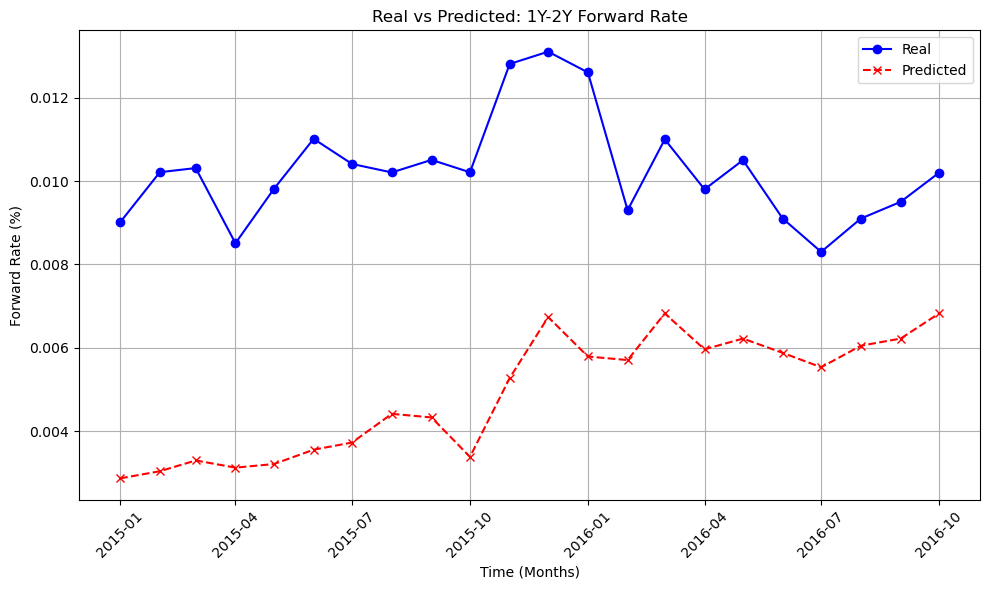

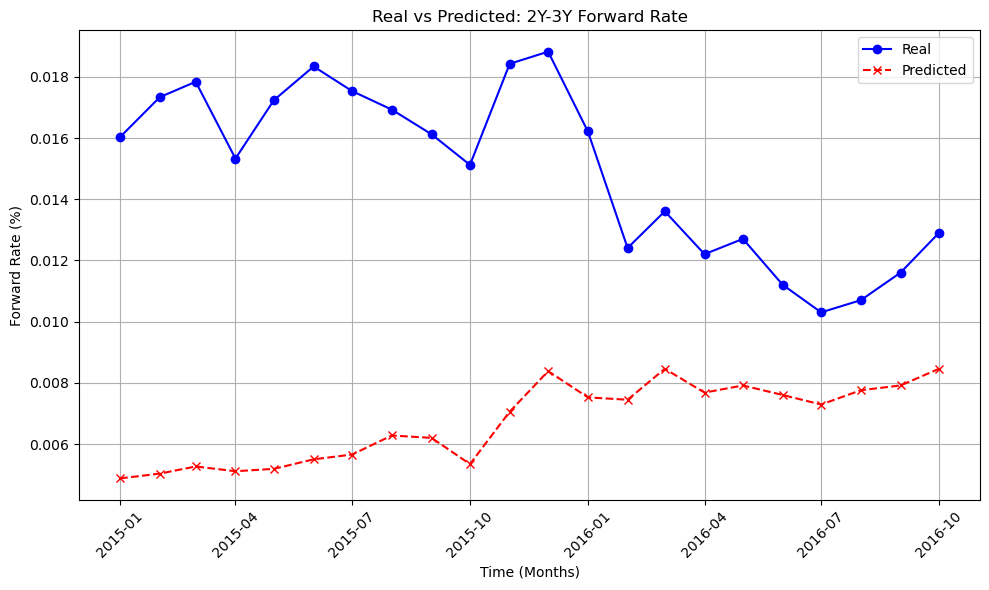

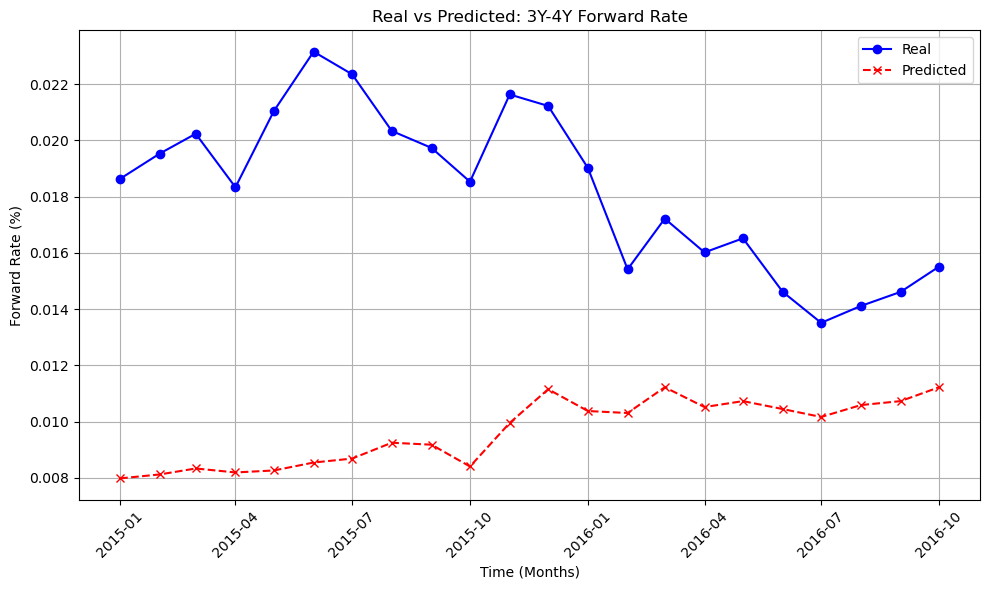

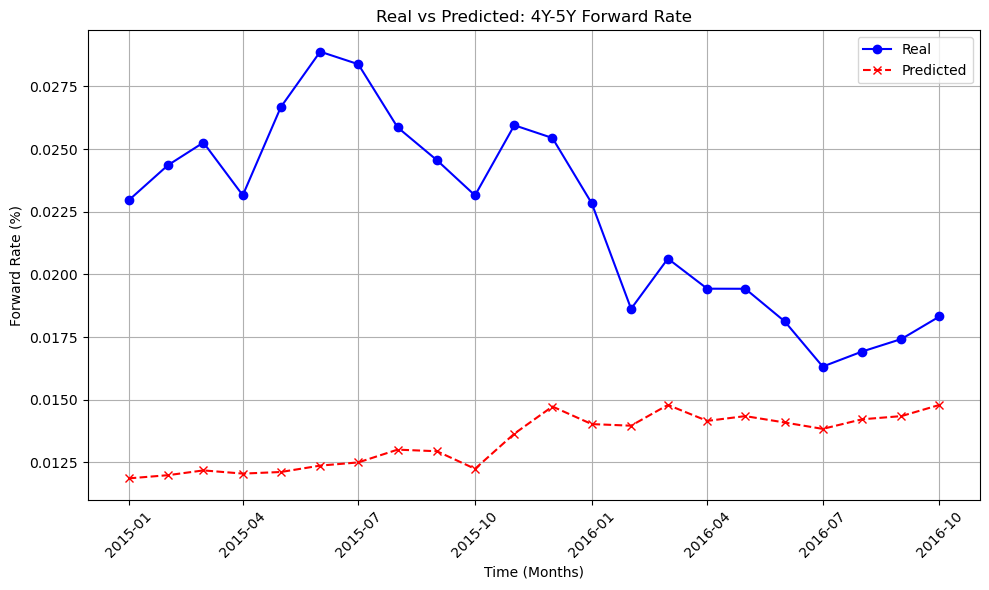

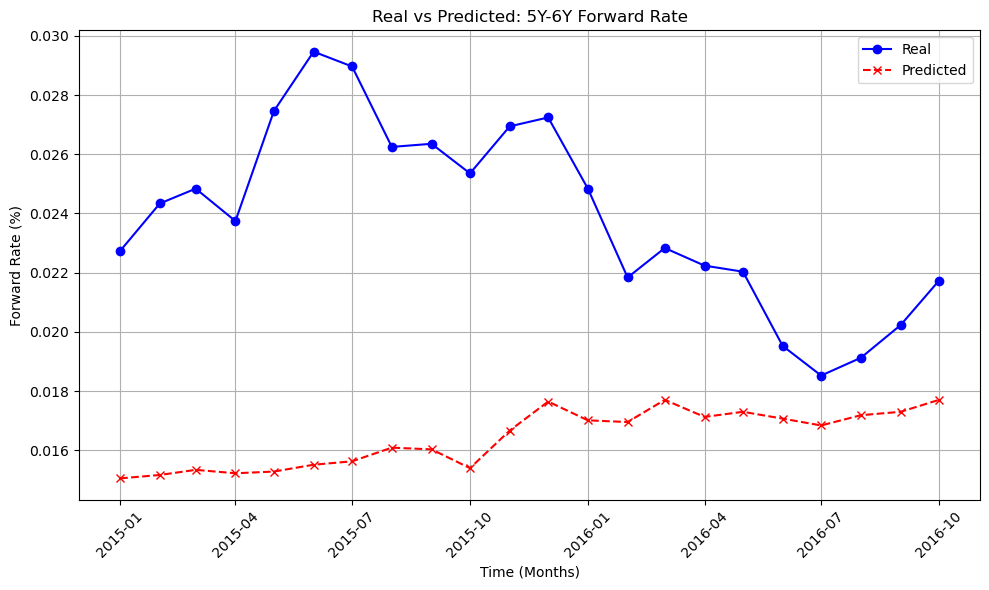

...

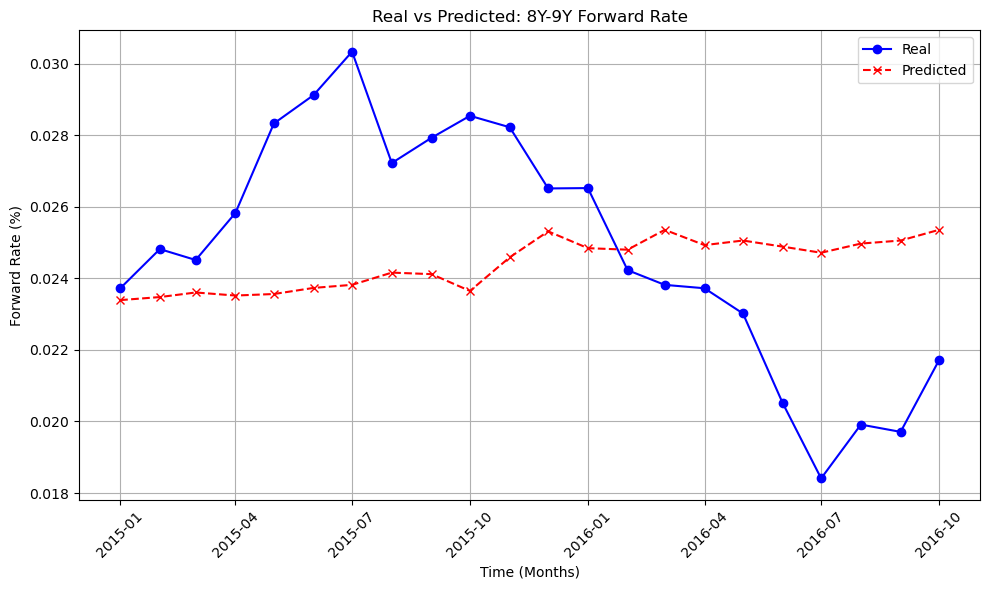

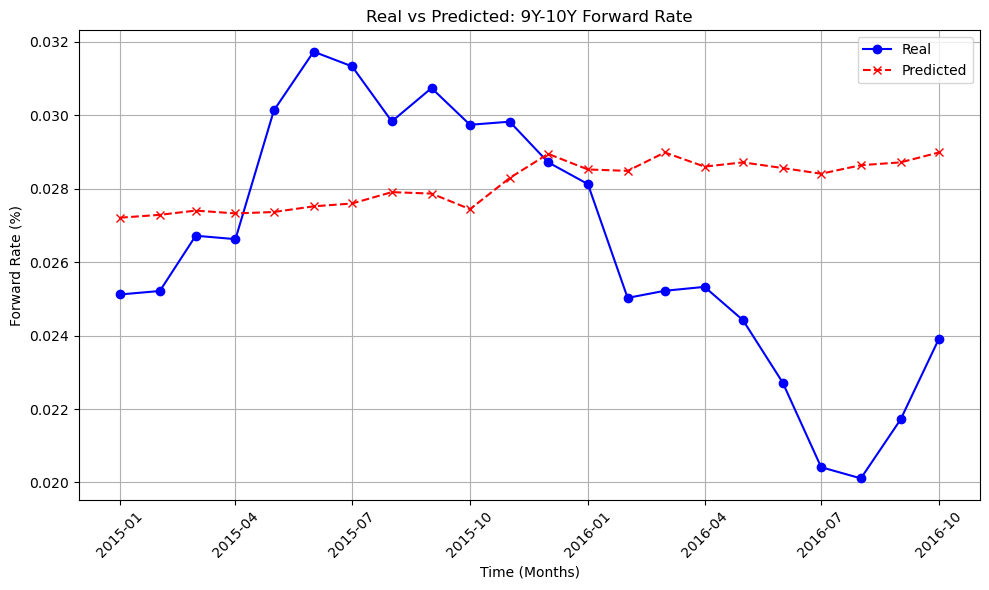

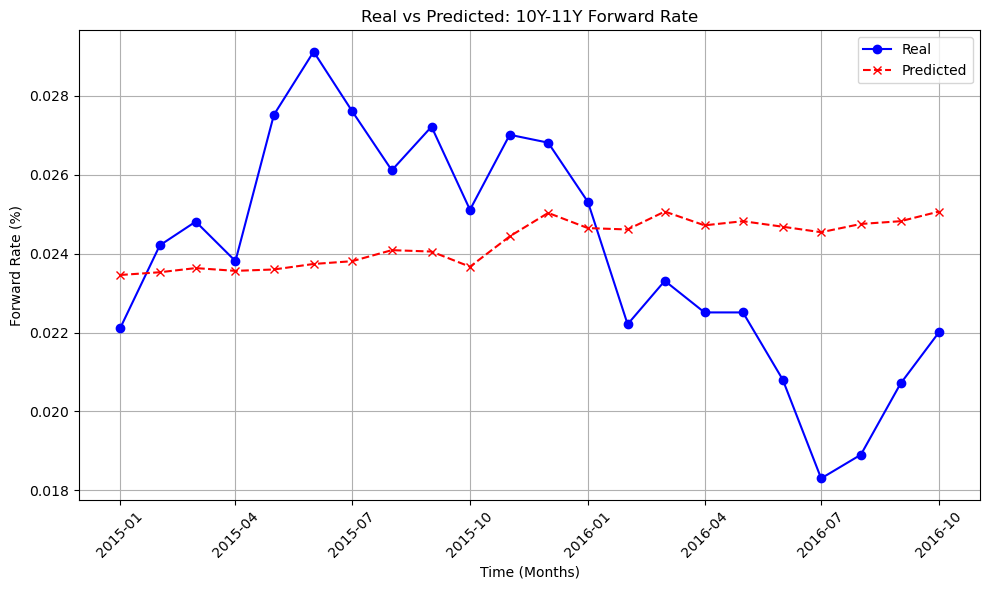

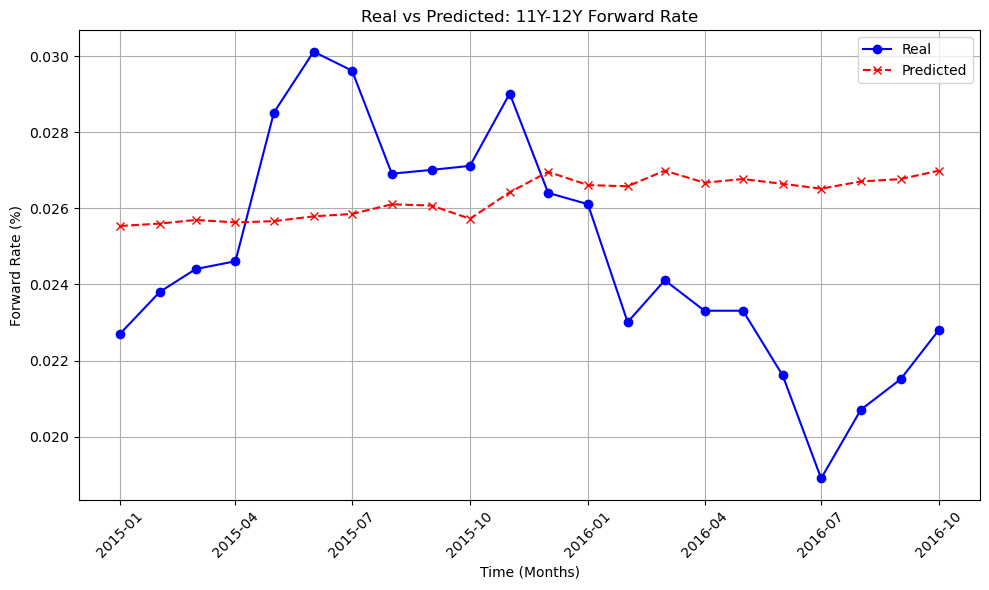

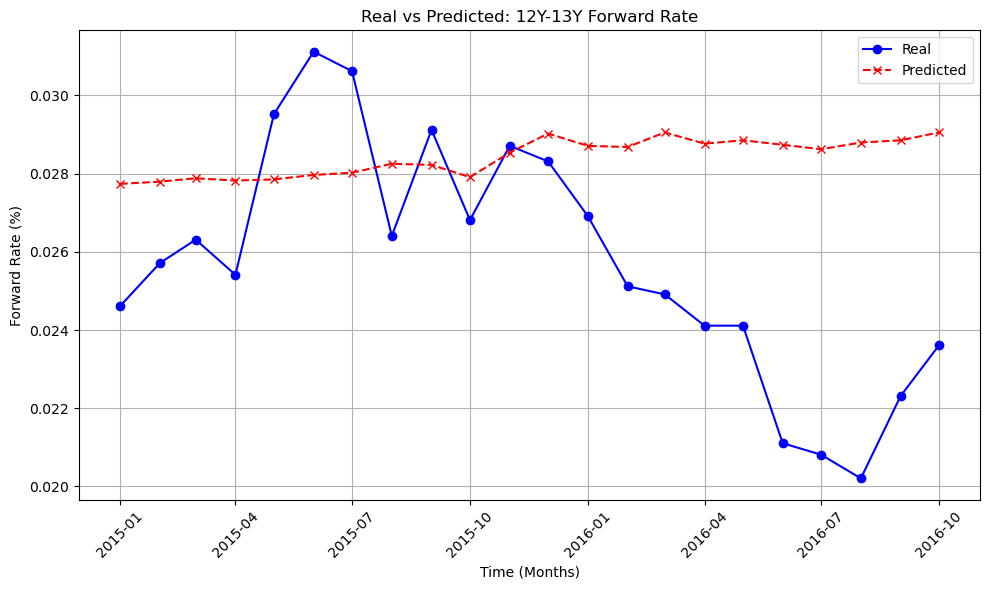

In [33]:
def plot_real_vs_predicted_matplotlib(test_data, prediction):
    """
    Plot real values versus predictions for each forward rate using Matplotlib.
    
    Args:
        test_data (pandas.DataFrame): DataFrame with the real forward rate values.
        prediction (pandas.DataFrame): DataFrame with the predicted forward rates.
    """
    for col in prediction.columns:
        # Get the real and predicted rates for each column
        real_rates = test_data[col]
        predicted_rates = prediction[col]
        
        # Create the plot
        plt.figure(figsize=(10, 6))
        
        # Plot the real rates
        plt.plot(real_rates.index, real_rates.values, label='Real', color='blue', marker='o')
        
        # Plot the predicted rates
        plt.plot(real_rates.index, predicted_rates.values, label='Predicted', color='red', linestyle='--', marker='x')
        
        # Add title and labels
        plt.title(f'Real vs Predicted: {col} Forward Rate')
        plt.xlabel('Time (Months)')
        plt.ylabel('Forward Rate (%)')
        
        # Add legend
        plt.legend()
        
        # Show the plot
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate

plot_real_vs_predicted_matplotlib(test_spot_data, test_spot_predictions)

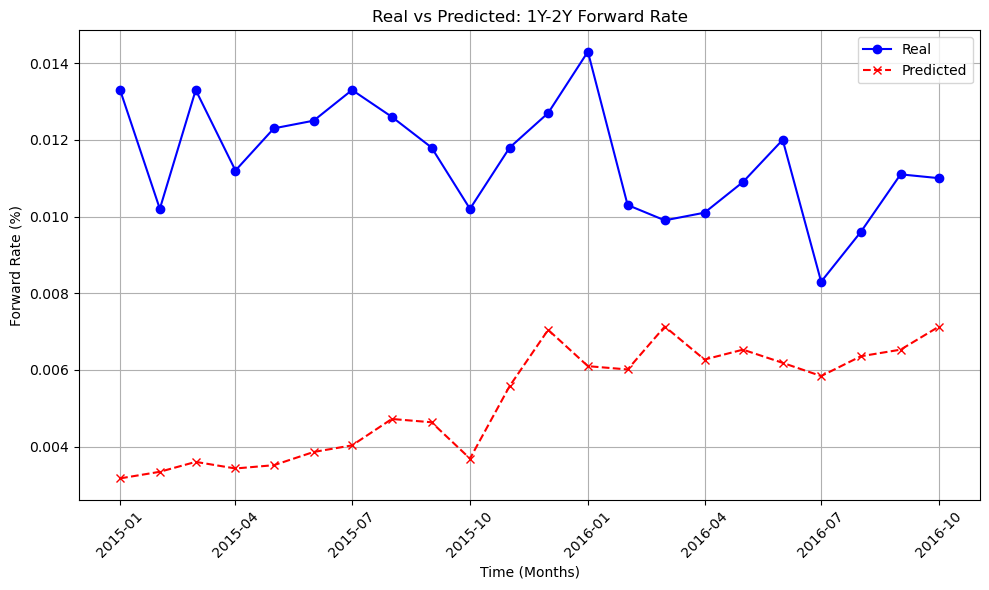

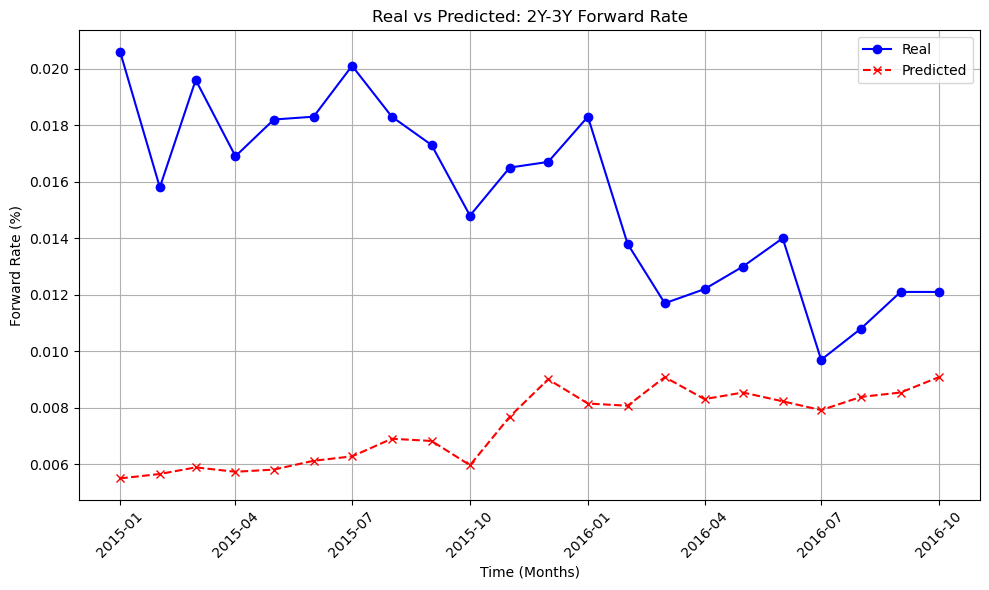

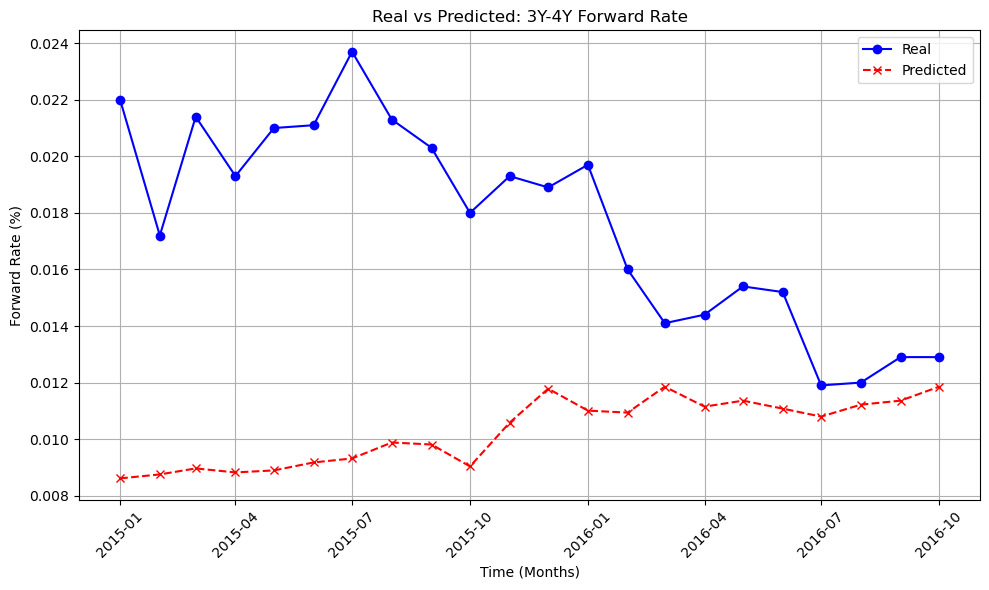

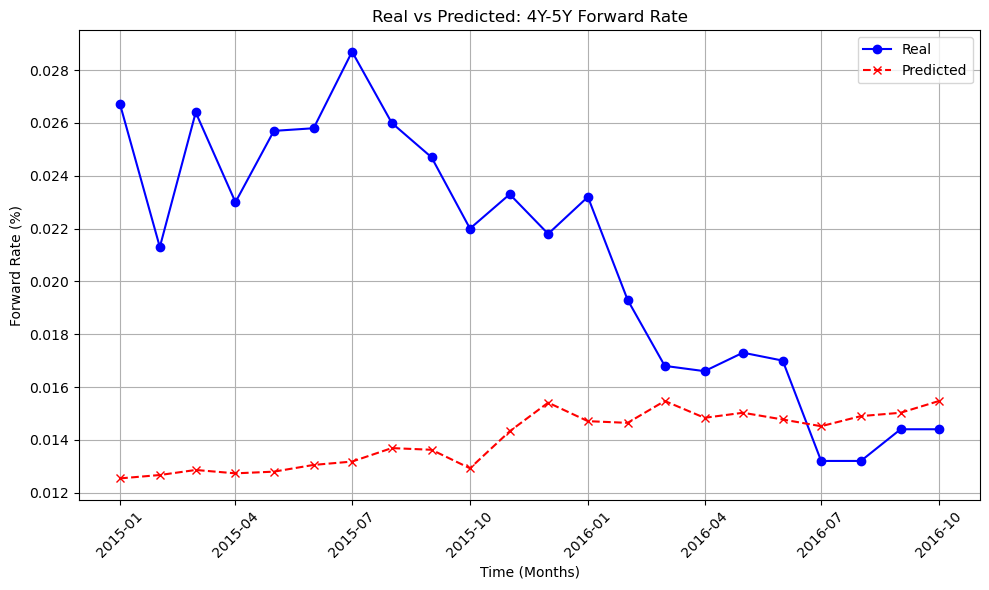

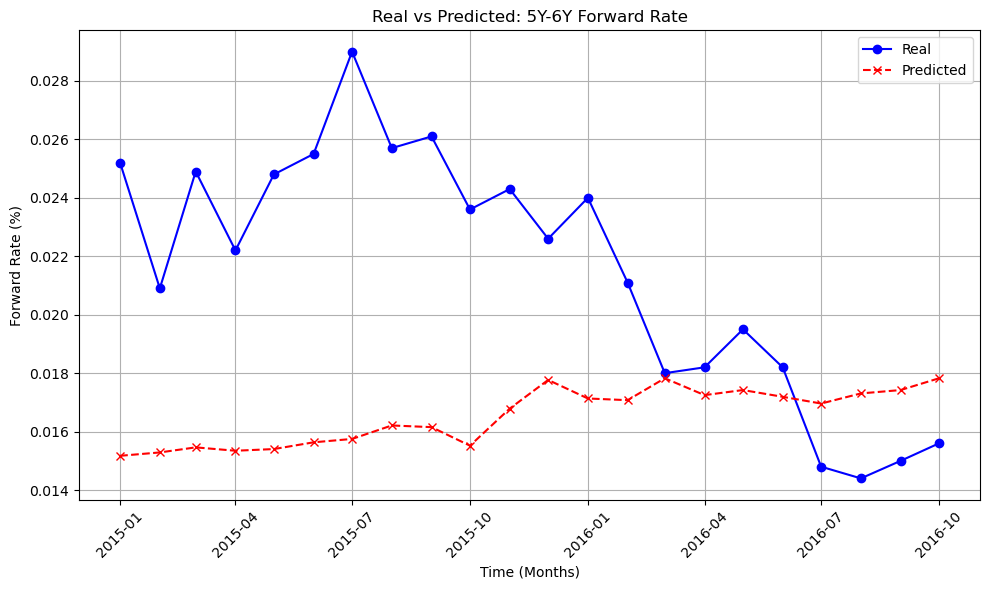

...

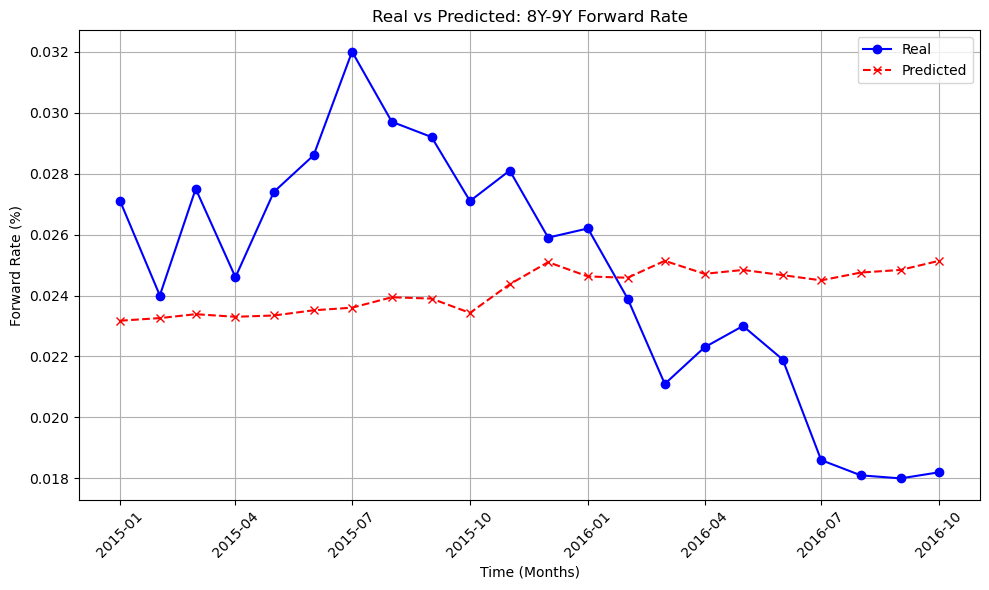

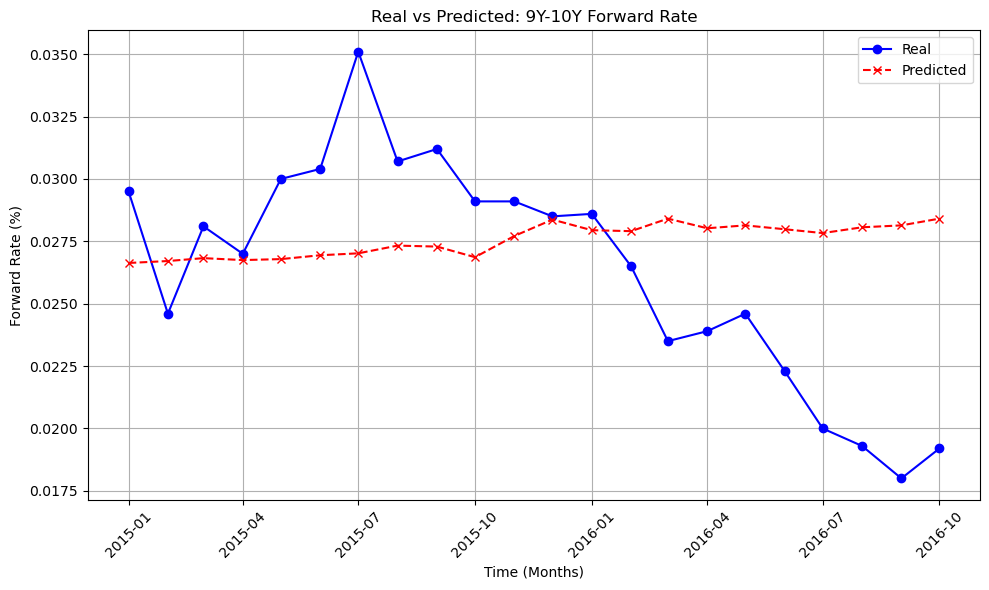

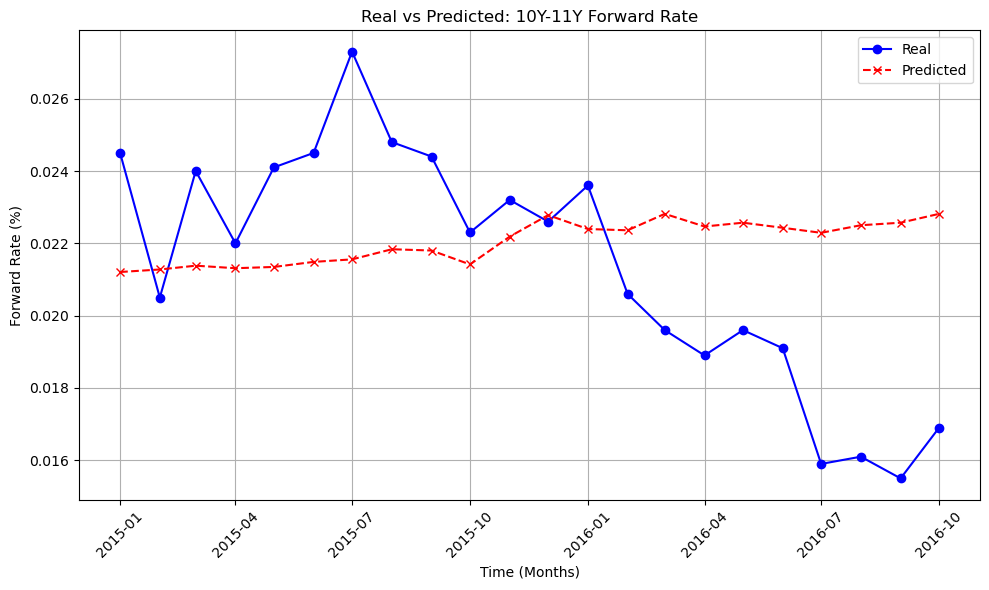

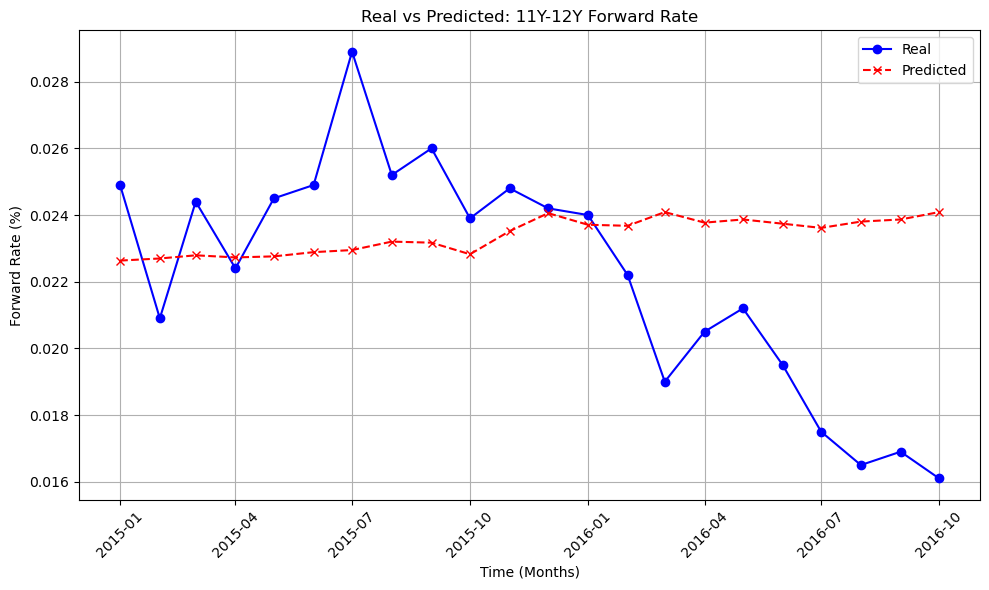

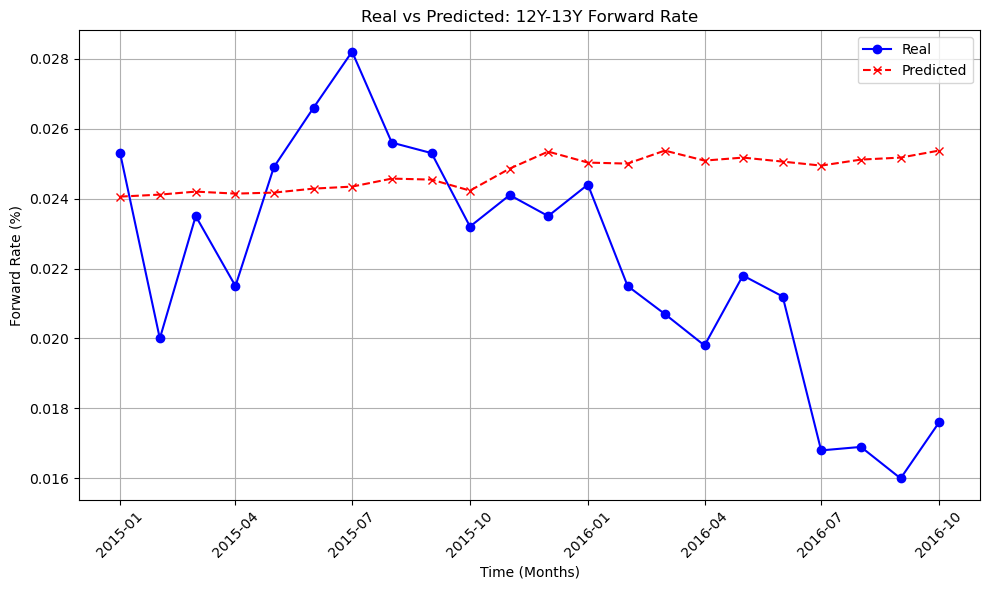

In [34]:
plot_real_vs_predicted_matplotlib(test_swap_data, test_swap_predictions)

### Conclusions

- **Backtesting Results**: 
   - The backtesting shows that, despite the low Mean Squared Error (MSE), the model's predictions for forward rates are not accurate.
   - This discrepancy suggests that a low MSE does not always imply a good model, especially when applied to real-world financial data.

- **Model Limitations**:
   - The CIR model, which is primarily designed for short-term interest rates, may not be ideal for longer maturity periods, as shown by the poor performance in predicting forward rates for longer time horizons.

- **Need for Further Exploration**:
   - While the MSE is a useful metric, further investigation with other models and more rigorous error analysis would be needed to improve predictions.
   - Exploring more complex models, such as machine learning or hybrid approaches, could provide better insights and predictions for long-term interest rates.

In [35]:
# Create a new row in the DataFrame where "0Y-1Y" will be equal to the previous month's "1Y-2Y"
new_row = pd.DataFrame(np.zeros((1, len(test_spot_data.columns))), columns=test_spot_data.columns)

# Assign the value of the previous month's "1Y-2Y" to "0Y-1Y" in the new row
new_row.iloc[0].at["0Y-1Y"] = test_spot_data["1Y-2Y"].iloc[-1]  # Tomamos el valor del último mes
new_row
# Append this new row to the test_data DataFrame
test_spot_data = pd.concat([test_spot_data, new_row], ignore_index=True)

M1_spot_predictions = generate_test_predictions(test_spot_data.iloc[[-1]], calibrated_spot_cir_models)
M1_spot_predictions["0Y-1Y"] = test_spot_data["0Y-1Y"].iloc[-1] 
cols = ['0Y-1Y'] + [col for col in M1_spot_predictions.columns if col != '0Y-1Y']
M1_spot_predictions = M1_spot_predictions[cols]

In [36]:
# Create a new row in the DataFrame where "0Y-1Y" will be equal to the previous month's "1Y-2Y"
new_row = pd.DataFrame(np.zeros((1, len(test_swap_data.columns))), columns=test_swap_data.columns)

# Assign the value of the previous month's "1Y-2Y" to "0Y-1Y" in the new row
new_row.iloc[0].at["0Y-1Y"] = test_swap_data["1Y-2Y"].iloc[-1]  # Tomamos el valor del último mes
new_row
# Append this new row to the test_data DataFrame
test_swap_data = pd.concat([test_swap_data, new_row], ignore_index=True)

M1_swap_predictions = generate_test_predictions(test_swap_data.iloc[[-1]], calibrated_swap_cir_models)
M1_swap_predictions["0Y-1Y"] = test_swap_data["0Y-1Y"].iloc[-1] 
cols = ['0Y-1Y'] + [col for col in M1_swap_predictions.columns if col != '0Y-1Y']
M1_swap_predictions = M1_swap_predictions[cols]

## Price ETF

### ETF Pricing Assumptions

To price the **LQD ETF** using our predicted forward rates, we simplify the ETF structure and treat it as a single representative bond. The key assumptions are:

- 📅 **Maturity**: We assume a constant **effective maturity of approximately 12.91 years**, based on LQD's reported data.
- 💰 **Coupon Rate**: The bond pays a fixed annual **coupon of 4.35%**.
- 🔁 **Simplifications**:
  - No reinvestment of coupons.
  - No bond turnover within the ETF.
- 🧮 **Valuation Approach**:
  - We apply forward rates to discount the future cash flows (coupons + principal).
  - The ETF is treated as a **fixed instrument**, not a dynamic portfolio.
- 📊 **Data Source**: All ETF characteristics (maturity, coupon) are based on public data from **BlackRock’s website** (as of 2025).

> 📌 Note: This is a simplified pricing model, intended to demonstrate how predicted forward rates could be applied to an ETF-like product. It does not account for all real-world dynamics of ETF management.

In [37]:
def price_etf_from_forward_curve_interpolated(forward_curve, maturity=12.91, coupon_rate=0.0435, face_value=100):
    """
    Price the ETF as a single bond using forward rates and interpolation for fractional maturity.
    
    Parameters:
        forward_curve (dict or pd.Series): predicted forward rates { '0Y-1Y': rate, '1Y-2Y': rate, ... }
        maturity (float): effective maturity of the bond
        coupon_rate (float): annual coupon rate (e.g., 0.0435 for 4.35%)
        face_value (float): face value of the bond
    
    Returns:
        float: estimated bond price
    """
    total_price = 0
    full_years = int(np.floor(maturity))
    coupon = coupon_rate * face_value

    # Cash flows
    for t in range(1, full_years + 1):
        key = f"{t-1}Y-{t}Y"
        rate = forward_curve.get(key, np.nan)
        if np.isnan(rate):
            continue
        discount_factor = 1 / (1 + rate) ** t
        total_price += coupon * discount_factor

    # Fraction of cash flows (partial coupon and full coupon)
    last_key = f"{full_years-1}Y-{full_years}Y"
    next_key = f"{full_years}Y-{full_years+1}Y"

    f1 = forward_curve.get(last_key, np.nan)
    f2 = forward_curve.get(next_key, np.nan)

    if not np.isnan(f1) and not np.isnan(f2):
        weight = maturity - full_years  # e.g., 12.91 - 12 = 0.91
        interpolated_rate = f1 + weight * (f2 - f1)

        discount_fractional = 1 / (1 + interpolated_rate) ** maturity

        # Partial coupon
        partial_coupon = coupon * weight
        total_price += partial_coupon * discount_fractional

        # Principal discount
        total_price += face_value * discount_fractional

    return total_price

print(f"Price of ETF lqd predicted from spot forward rates at 11-2016: {price_etf_from_forward_curve_interpolated(M1_spot_predictions.iloc[0]):.2f}", )
print(f"Price of ETF lqd predicted from implied swap forward rates at 11-2016: {price_etf_from_forward_curve_interpolated(M1_swap_predictions.iloc[0]):.2f}", )
print(f"Price of ETF lqd quoted at 11-2016: {lqd_df.loc['2016-11-01', 'Adj Close_LQD']:.2f}")

Price of ETF lqd predicted from spot forward rates at 11-2016: 116.16
Price of ETF lqd predicted from implied swap forward rates at 11-2016: 119.31
Price of ETF lqd quoted at 11-2016: 90.60


## Model Limitations and Assumptions

- Although we used the **Cox-Ingersoll-Ross (CIR)** model to predict **forward rates**, it is more suitable for predicting short-term rates, such as **Overnight Secured Rates** or **Short Repo Rates**.

- We used **Treasury yields** and **Swap Rates** as proxies to calculate the forward rates. However, these proxies may not accurately reflect the discount rate for **corporate bonds** included in the **ETF**.

- Lastly, we assumed that the **average maturity** and **average coupon** in 2025 would be the same as in 2016 due to the lack of historical data for 2025.

- The goal of this project is to demonstrate how the **future bond pricing process** works using the CIR model and forward rates.

## Potential Extensions for Future Work

- **Jump Diffusion Models**: An extension of the **Cox-Ingersoll-Ross (CIR)** model could involve incorporating **jump diffusion processes** to account for economic shocks or sudden changes in market conditions. These models introduce jumps in the rate process, allowing for more realistic price movements that are not captured by continuous diffusion alone.

    - The dynamics of the **Jump Diffusion Model** for interest rates can be represented as:
    
    $$
    dr_t = \kappa (\theta - r_t) dt + \sigma r_t dW_t + J_t dN_t
    $$
    
    Where:
    - $ r_t $ is the interest rate at time $ t $,
    - $ \kappa $ is the rate of mean reversion,
    - $ \theta$ is the long-term mean,
    - $ \sigma $ is the volatility of the rate,
    - $ W_t $ is the Wiener process (representing the continuous stochastic component),
    - $ J_t $ is the jump size,
    - $ N_t $ is a Poisson process modeling the jumps.

    This equation models the continuous evolution of the interest rate with random jumps introduced at random intervals, which can be triggered by unexpected economic events.

- **XGBoost Regression Model**: We could explore using **XGBoost**, a powerful machine learning technique, for multivariate regression. This method could incorporate exogenous variables such as **GDP growth** and **inflation rates**, which significantly affect interest rates. After fitting the deterministic part of the model with XGBoost, we could perform a **Monte Carlo simulation** to introduce stochastic noise (i.e., **XGBoost predictions + sigma * dW**), capturing the uncertainty and randomness in the market.

    - The **XGBoost model** would typically be represented as a regression problem, where the prediction $ \hat{r}_t $ is made by fitting a model to the input features $ X_t $ (e.g., GDP, inflation):
    
    $$
    \hat{r}_t = f(X_t; \theta)
    $$
    
    Where:
    - $ \hat{r}_t $ is the predicted interest rate at time $ t $,
    - $ f(X_t; \theta) $ is the model function, which is learned from the data and the parameters $ \theta $,
    - $ X_t $ represents the exogenous variables (e.g., GDP growth, inflation),
    - $ \theta $ represents the parameters learned by the XGBoost algorithm.

    Once the deterministic prediction $ \hat{r}_t $ is made, we can add stochastic noise to incorporate the inherent randomness:

    $$
    r_t = \hat{r}_t + \sigma \cdot dW_t
    $$
    
    Where:
    - $ \sigma $ is the volatility (standard deviation of the forecast),
    - $ dW_t $ is the increment of the Wiener process (standard Brownian motion).

These extensions could further enhance the accuracy and robustness of the forward rate predictions and bond pricing, especially in more volatile market environments.